<a href="https://colab.research.google.com/github/DhirajBembade/Customer-Churn-Pred/blob/main/Customer%20Churn%20Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Telcome: Customer Churn Prediction 📡:**


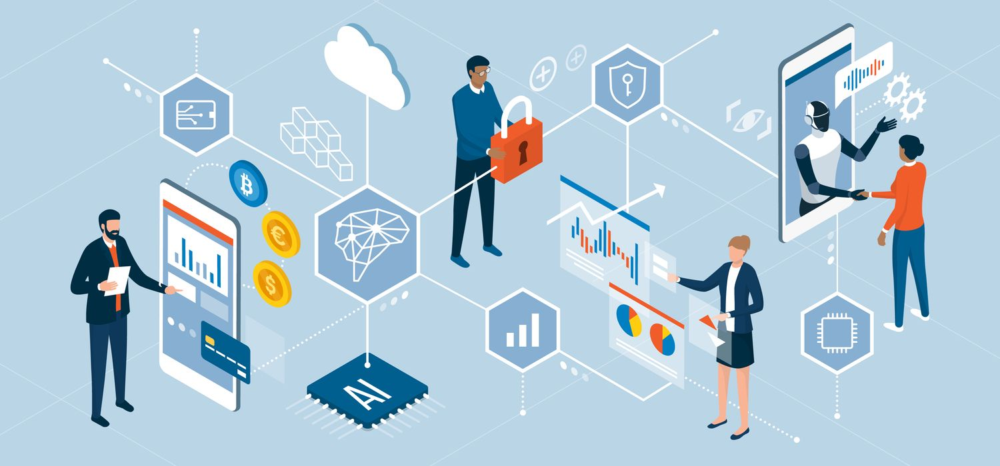

# **Importing Necessary libraries- 📥**

In [1]:
# Data processing, Linear algebra
import pandas as pd
import numpy as np

# Data Visualization
import seaborn as sns
import matplotlib.pyplot as plt

import scipy.stats as stats 
import statsmodels.api as sm

import warnings
warnings.filterwarnings("ignore")

# **Mounting Dataset 📂-**

In [2]:
# df=churn
churn = pd.read_csv('/content/drive/MyDrive/telecom_churn.csv')

# **Basic Information About  Dataset📝-**

In [3]:
churn.shape

(3333, 20)

In [4]:
#df.head() #df.tail()
churn

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,AZ,192,415,No,Yes,36,156.2,77,26.55,215.5,126,18.32,279.1,83,12.56,9.9,6,2.67,2,False
3329,WV,68,415,No,No,0,231.1,57,39.29,153.4,55,13.04,191.3,123,8.61,9.6,4,2.59,3,False
3330,RI,28,510,No,No,0,180.8,109,30.74,288.8,58,24.55,191.9,91,8.64,14.1,6,3.81,2,False
3331,CT,184,510,Yes,No,0,213.8,105,36.35,159.6,84,13.57,139.2,137,6.26,5.0,10,1.35,2,False


In [5]:
churn.columns

Index(['State', 'Account length', 'Area code', 'International plan',
       'Voice mail plan', 'Number vmail messages', 'Total day minutes',
       'Total day calls', 'Total day charge', 'Total eve minutes',
       'Total eve calls', 'Total eve charge', 'Total night minutes',
       'Total night calls', 'Total night charge', 'Total intl minutes',
       'Total intl calls', 'Total intl charge', 'Customer service calls',
       'Churn'],
      dtype='object')

In [6]:
churn.duplicated().sum()

0

# **Checking for NaN values🔎-**

In [7]:
churn.isnull().sum()

State                     0
Account length            0
Area code                 0
International plan        0
Voice mail plan           0
Number vmail messages     0
Total day minutes         0
Total day calls           0
Total day charge          0
Total eve minutes         0
Total eve calls           0
Total eve charge          0
Total night minutes       0
Total night calls         0
Total night charge        0
Total intl minutes        0
Total intl calls          0
Total intl charge         0
Customer service calls    0
Churn                     0
dtype: int64

In [8]:
churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   3333 non-null   object 
 1   Account length          3333 non-null   int64  
 2   Area code               3333 non-null   int64  
 3   International plan      3333 non-null   object 
 4   Voice mail plan         3333 non-null   object 
 5   Number vmail messages   3333 non-null   int64  
 6   Total day minutes       3333 non-null   float64
 7   Total day calls         3333 non-null   int64  
 8   Total day charge        3333 non-null   float64
 9   Total eve minutes       3333 non-null   float64
 10  Total eve calls         3333 non-null   int64  
 11  Total eve charge        3333 non-null   float64
 12  Total night minutes     3333 non-null   float64
 13  Total night calls       3333 non-null   int64  
 14  Total night charge      3333 non-null   

# **Statistical information of Dataframe 📈 -**

In [9]:
churn.describe(include = "all")

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
count,3333,3333.000000,3333.000000,3333,3333,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333
unique,51,NaN,NaN,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
top,WV,NaN,NaN,No,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
freq,106,NaN,NaN,3010,2411,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2850
mean,NaN,101.064806,437.182418,NaN,NaN,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856,NaN
std,NaN,39.822106,42.371290,NaN,NaN,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491,NaN
min,NaN,1.000000,408.000000,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000,NaN
25%,NaN,74.000000,408.000000,NaN,NaN,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000,NaN
50%,NaN,101.000000,415.000000,NaN,NaN,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000,NaN
75%,NaN,127.000000,510.000000,NaN,NaN,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000,NaN


In [10]:
churn.nunique()

State                       51
Account length             212
Area code                    3
International plan           2
Voice mail plan              2
Number vmail messages       46
Total day minutes         1667
Total day calls            119
Total day charge          1667
Total eve minutes         1611
Total eve calls            123
Total eve charge          1440
Total night minutes       1591
Total night calls          120
Total night charge         933
Total intl minutes         162
Total intl calls            21
Total intl charge          162
Customer service calls      10
Churn                        2
dtype: int64

#**EDA-**

Task:

1. Handling outliers and missing values

2. Finding variables that has some relation to target variable 

3. Handling Multicollinearity among the varaibles

In [11]:
# no null values
# Target variable is Churn, converting it to int values (0,1)

churn["Churn"] = churn["Churn"].replace({True: 1, False: 0});
churn["Voice mail plan"] = churn["Voice mail plan"].replace({"Yes": 1, "No": 0});
churn["International plan"] = churn["International plan"].replace({"Yes": 1, "No": 0});


In [12]:
#dropping columns that are not essential
churn = churn.drop(['State', 'Area code'], axis = 1)

In [13]:
churn.Churn.value_counts(normalize = True)

0    0.855086
1    0.144914
Name: Churn, dtype: float64

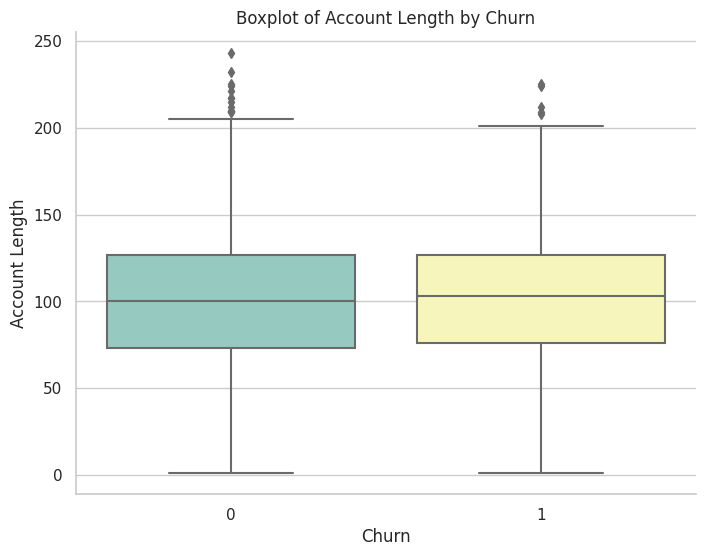

In [14]:
#EDA to select the variables

# Set the style of the plot
sns.set(style="whitegrid")

# Create the boxplot
plt.figure(figsize=(8, 6))
sns.boxplot(x="Churn", y="Account length", data=churn, palette="Set3")

# Set labels and title
plt.xlabel("Churn")
plt.ylabel("Account Length")
plt.title("Boxplot of Account Length by Churn")

# Remove the top and right spines
sns.despine()

# Show the plot
plt.show()


👉
 * **Visually we see that account length has no effect on churn.**

 * **We can verify this by an independent t-test (For Demonstration, only effect of one variable on target variable is tested)**


In [15]:
a = churn["Account length"][churn["Churn"] == 1] 
b = churn["Account length"][churn["Churn"] == 0]

stats.ttest_ind(a = a, b = b)

Ttest_indResult(statistic=0.9547765176420726, pvalue=0.3397600070563822)

### **Analysis of the t-test-**


 * **We have the following hypothesis :**

   * h0 : mean of Account lenght of people that churned == mean of Account lenght of people that did not churned.

   * ha : mean of Account lenght of people that churned != mean of Account lenght of people that did not churned.

**Since p-value > 0.05, we cannot reject the null hypothesis. (p-value is the probability of making type-I error)**

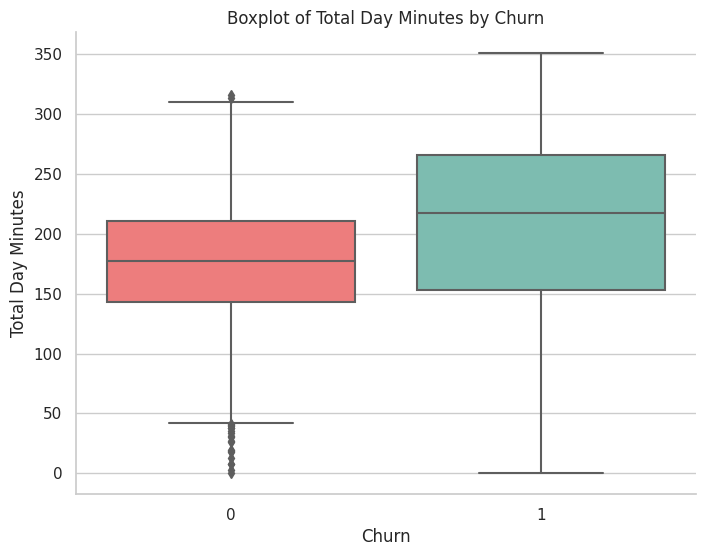

In [16]:
# Set the style of the plot
sns.set(style="whitegrid")

# Define a custom color palette
custom_palette = ["#FF6B6B", "#73C6B6"]

# Create the boxplot with custom palette
plt.figure(figsize=(8, 6))
sns.boxplot(x="Churn", y="Total day minutes", data=churn, palette=custom_palette)

# Set labels and title
plt.xlabel("Churn")
plt.ylabel("Total Day Minutes")
plt.title("Boxplot of Total Day Minutes by Churn")

# Remove the top and right spines
sns.despine()

# Show the plot
plt.show()


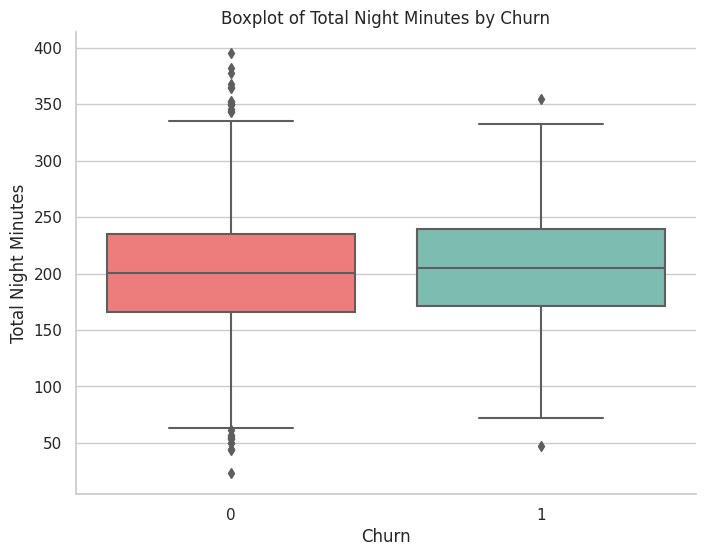

In [17]:
# Set the style of the plot
sns.set(style="whitegrid")

# Define a custom color palette
custom_palette = ["#FF6B6B", "#73C6B6"]

# Create the boxplot with custom palette
plt.figure(figsize=(8, 6))
sns.boxplot(x="Churn", y="Total night minutes", data=churn, palette=custom_palette)

# Set labels and title
plt.xlabel("Churn")
plt.ylabel("Total Night Minutes")
plt.title("Boxplot of Total Night Minutes by Churn")

# Remove the top and right spines
sns.despine()

# Show the plot
plt.show()


## **Observations so far-**

1. No missing values.

2. Data is imbalanced :

  * 1 - 14.49% (for now we will use the imbalanced dataset to evaluate the models)
  * 0 - 85.55% (A balanced dataset will have atleat 70%-30% distribution)

3. People having higher day usage are leaving the service. Maybe the they are going to a competitor that offers lower prices on higher usage.

4. There is no effect of duration of night usage on churn.


##**Multi-collinearity-**

<Figure size 1000x800 with 0 Axes>

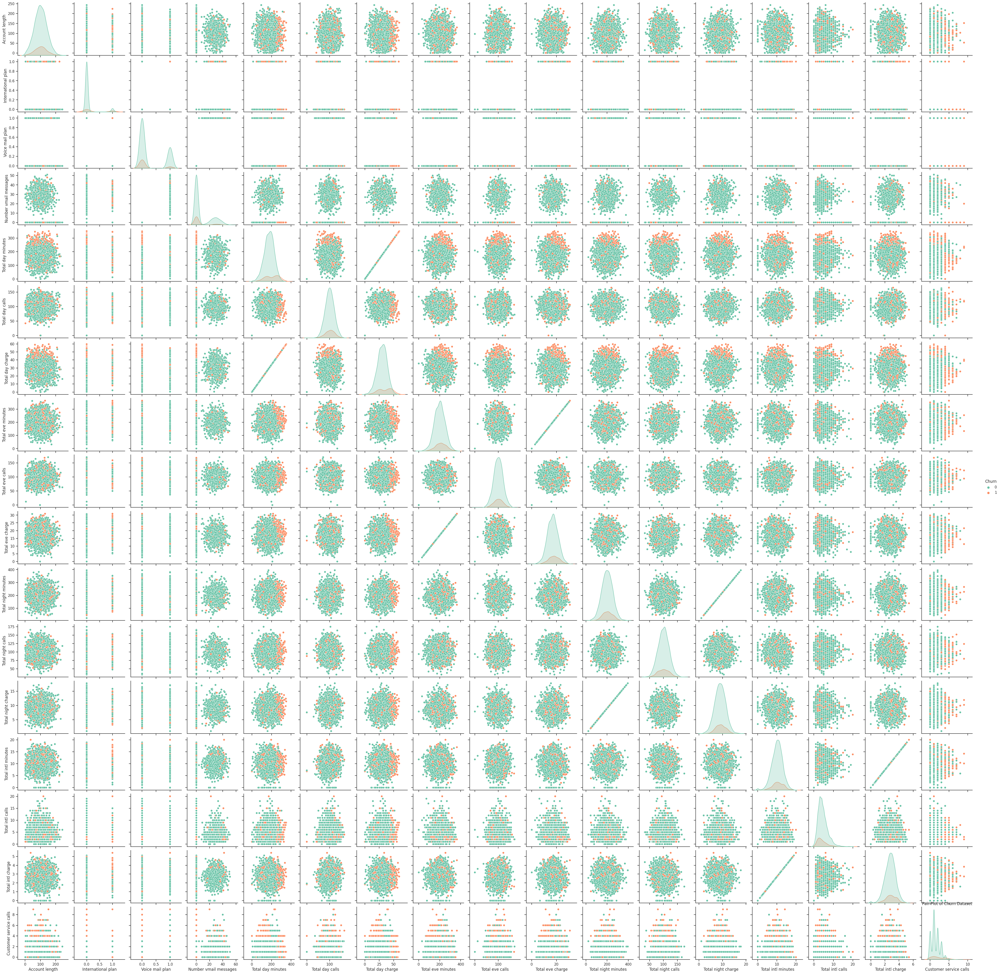

In [18]:
# Searching for Multi-collinearity-

# Set the style of the plot
sns.set(style="ticks")
# Create the pair plot
plt.figure(figsize=(10, 8))
sns.pairplot(churn, hue="Churn", palette="Set2")
# Set title
plt.title("Pair Plot of Churn Dataset")
# Remove the top and right spines
sns.despine()
# Show the plot
plt.show()


##**Correlation-**

In [19]:
churn.corr()

,Account length,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
Account length,1.000000,0.024735,0.002918,-0.004628,0.006216,0.038470,0.006214,-0.006757,0.019260,-0.006745,-0.008955,-0.013176,-0.008960,0.009514,0.020661,0.009546,-0.003796,0.016541
International plan,0.024735,1.000000,0.006006,0.008745,0.049396,0.003755,0.049398,0.019100,0.006114,0.019106,-0.028905,0.012451,-0.028913,0.045871,0.017366,0.045780,-0.024522,0.259852
Voice mail plan,0.002918,0.006006,1.000000,0.956927,-0.001684,-0.011086,-0.001686,0.021545,-0.006444,0.021559,0.006079,0.015553,0.006064,-0.001318,0.007618,-0.001276,-0.017824,-0.102148
Number vmail messages,-0.004628,0.008745,0.956927,1.000000,0.000778,-0.009548,0.000776,0.017562,-0.005864,0.017578,0.007681,0.007123,0.007663,0.002856,0.013957,0.002884,-0.013263,-0.089728
Total day minutes,0.006216,0.049396,-0.001684,0.000778,1.000000,0.006750,1.000000,0.007043,0.015769,0.007029,0.004323,0.022972,0.004300,-0.010155,0.008033,-0.010092,-0.013423,0.205151
Total day calls,0.038470,0.003755,-0.011086,-0.009548,0.006750,1.000000,0.006753,-0.021451,0.006462,-0.021449,0.022938,-0.019557,0.022927,0.021565,0.004574,0.021666,-0.018942,0.018459
Total day charge,0.006214,0.049398,-0.001686,0.000776,1.000000,0.006753,1.000000,0.007050,0.015769,0.007036,0.004324,0.022972,0.004301,-0.010157,0.008032,-0.010094,-0.013427,0.205151
Total eve minutes,-0.006757,0.019100,0.021545,0.017562,0.007043,-0.021451,0.007050,1.000000,-0.011430,1.000000,-0.012584,0.007586,-0.012593,-0.011035,0.002541,-0.011067,-0.012985,0.092796
Total eve calls,0.019260,0.006114,-0.006444,-0.005864,0.015769,0.006462,0.015769,-0.011430,1.000000,-0.011423,-0.002093,0.007710,-0.002056,0.008703,0.017434,0.008674,0.002423,0.009233
Total eve charge,-0.006745,0.019106,0.021559,0.017578,0.007029,-0.021449,0.007036,1.000000,-0.011423,1.000000,-0.012592,0.007596,-0.012601,-0.011043,0.002541,-0.011074,-0.012987,0.092786


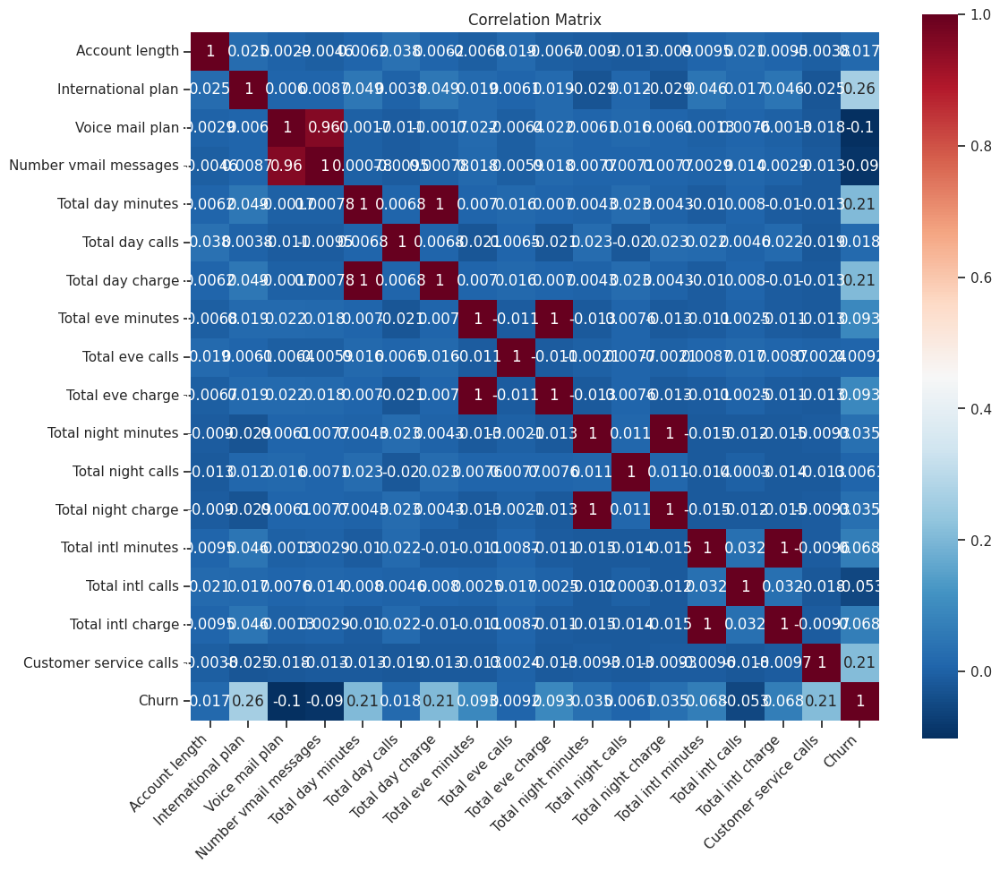

In [20]:
correlation_matrix = churn.corr()
plt.figure(figsize=(12, 10))  # Increase the figure size

sns.heatmap(correlation_matrix, annot=True, cmap="RdBu_r", square=True)

plt.title("Correlation Matrix")  # Set the title of the plot

# Rotate x-axis and y-axis labels for better readability
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()  # Display the plot


###**Note**:

 * **Correlation is measured between two continuous variables**

 * **Variables like 'Total day charge' and 'Total day minutes' are perfectly correlated.**

 * **This is no surprise because the duration is used to bill the customer.**

**Our task would be reduce multicollinearity or better performance of the model. However for model evaluation, the model will be built on all features first**

# **Model Building-**

In [21]:
target = churn["Churn"]
X = churn.drop(["Churn"], axis = 1)

In [22]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, target, test_size=0.2, random_state=42)

In [23]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

# Create a StandardScaler object
#scaler = StandardScaler()

# Standardize the training and testing features
#X_train_scaled = scaler.fit_transform(X_train)
#X_test_scaled = scaler.transform(X_test)

# Create a Logistic Regression model
logit = LogisticRegression()

# Fit the model on the standardized training data
logit.fit(X_train, y_train)


LogisticRegression()

In [24]:
#import statsmodels.api as sm

X_train_sm = sm.add_constant(X_train)  # Add constant for intercept

sm_model = sm.Logit(y_train, X_train_sm).fit()  # Fit logistic regression model


Optimization terminated successfully.
         Current function value: 0.323335
         Iterations 7


In [25]:
print(sm_model.summary())

                           Logit Regression Results                           
Dep. Variable:                  Churn   No. Observations:                 2666
Model:                          Logit   Df Residuals:                     2648
Method:                           MLE   Df Model:                           17
Date:                Tue, 30 May 2023   Pseudo R-squ.:                  0.2131
Time:                        14:29:50   Log-Likelihood:                -862.01
converged:                       True   LL-Null:                       -1095.4
Covariance Type:            nonrobust   LLR p-value:                 1.823e-88
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -7.5653      0.803     -9.422      0.000      -9.139      -5.991
Account length             0.0007      0.002      0.410      0.682      -0.002       0.004
Inte

## **Analysis of the summary -**

**1. Pseudo R-squ = 1 - (Log-Likelihood/LL-Null), It is similar to R-squ. For this model it is 0.21 which is very low. It is low beacuase multicollinearity exists and we haven't treated it yet.**

**2. We observe that a lot of features have p-value less than 0.05, it shows multicollinearity and hence can be dropped to increase the model performance**

In [26]:
# Extracting the summary table as a dataframe
coef_sm = pd.read_html(sm_model.summary().tables[1].as_html(), header=0, index_col=0)[0]

# Calculating the odds ratio
coef_sm['odds_ratio'] = np.exp(coef_sm['coef'])
coef_sm

,coef,std err,z,P>|z|,[0.025,0.975],odds_ratio
const,-7.5653,0.803,-9.422,0.000,-9.139,-5.991,5.181219e-04
Account length,0.0007,0.002,0.410,0.682,-0.002,0.004,1.000700e+00
International plan,2.0988,0.163,12.911,0.000,1.780,2.417,8.156376e+00
Voice mail plan,-1.5947,0.651,-2.450,0.014,-2.870,-0.319,2.029694e-01
Number vmail messages,0.0221,0.021,1.070,0.285,-0.018,0.063,1.022346e+00
Total day minutes,-1.9282,3.686,-0.523,0.601,-9.152,5.296,1.454097e-01
Total day calls,-0.0002,0.003,-0.059,0.953,-0.006,0.006,9.998000e-01
Total day charge,11.4133,21.681,0.526,0.599,-31.080,53.907,9.051764e+04
Total eve minutes,1.4307,1.851,0.773,0.440,-2.198,5.059,4.181625e+00
Total eve calls,0.0016,0.003,0.514,0.607,-0.004,0.008,1.001601e+00


###**What the odds ratio says ?**

* In linear regression, the co-efficients can be studied. The co-efficients tell the impact of that particular variable on the target variabe. (That is why the gradient is calculated) 

* But in the logistic regression, it is not that straight forward because the co-effs are fed into a sigmoid function to calculate the probability.

Odds ratio is studied as the impact it has on the target variable. Odds ratio = exp(co-eff)

In [27]:
# Prediction from Statmodel-

# Add constant for intercept to the test set
X_test_sm = sm.add_constant(X_test)

# Predict probabilities using the trained model
pred_sm_prob = sm_model.predict(X_test_sm)  # This gives the prediction as probabilities

# Convert probabilities to predicted classes
pred_sm = np.where(pred_sm_prob > 0.5, 1, 0)  # Converting the probabilities as predictions (0 or 1)


In [28]:
# Prediction from sklearn model
y_pred = logit.predict(X_test)

In [29]:
y_sk_prob = logit.predict_proba(X_test)[:,1]

In [30]:
#Model comparision using confusion matrix
from sklearn.metrics import confusion_matrix, precision_score, recall_score

print("Stats Model: ")
print("Confusion Matrix:")
print(confusion_matrix(y_test, pred_sm))
print("Precision Score:", precision_score(y_test, pred_sm))
print("Recall Score:", recall_score(y_test, pred_sm))

print("Sklearn Model: ")
print("Precision Score:", precision_score(y_test, y_pred))
print("Recall Score:", recall_score(y_test, y_pred))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Stats Model: 
Confusion Matrix:
[[554  12]
 [ 86  15]]
Precision Score: 0.5555555555555556
Recall Score: 0.1485148514851485
Sklearn Model: 
Precision Score: 0.2857142857142857
Recall Score: 0.019801980198019802
Confusion Matrix:
[[561   5]
 [ 99   2]]


In [31]:
# Effect of cutoff on model performance
pred = np.where(pred_sm_prob > 0.3, 1, 0)  # Lowering the cutoff to 0.3

print("Stats Model:")
print("Confusion Matrix:")
print(confusion_matrix(y_test, pred))
print("Precision Score:", precision_score(y_test, pred))
print("Recall Score:", recall_score(y_test, pred))


Stats Model:
Confusion Matrix:
[[527  39]
 [ 60  41]]
Precision Score: 0.5125
Recall Score: 0.40594059405940597


 ## 👉 **We observe that that choice of cut-off has effect on both recall and precision.**



 ## **What effects our model?**
1. The choice of features/variables used to train the model

2. The choice of cut-off


* Since the cut-off has effect on the predictions, it is not straight forward to compare models in terms of R-square.

* From various models trained on different variable of the same dataset, the choice for best model is done based on ROC-AUC curve

* Once the model is selected, the cut-off is decided from the Recall-Precision curve based on the business requirement.

## **Selecting the best model based on the features it is trained on-**

* For plotting ROC-AUC curve, True Positive Rate(TPR) and False Positive Rate (FPR) is required.

* Calculating TPR and FPR. -
   * TPR = TP/(TP+FN)
   * FPR = FP/(FP+TN)

* TP = True Positive; FP = False Positve; TN = True Negative; FP = False Negative

* The predicted probabilities are converted to predicted class(0,1) at different cut-off.

* At each cut-off a predicted class of either 0 or 1 is obtained and this is used to construct a confusion matrix w.r.t true classes.

* For different models the FPR vs TPR curve is plotted. Model having higher area under the curve has better performance and essentially means that for higher change in TPR there's very small change in FPR

In [32]:
# FPR VS TPR-

from sklearn.metrics import roc_curve, auc

# Compute ROC curve and AUC for scikit-learn model
fpr, tpr, thresholds = roc_curve(y_test, y_sk_prob, pos_label=1)
roc_auc = auc(fpr, tpr)

# Compute ROC curve and AUC for statsmodels model
fpr_sm, tpr_sm, thresholds_sm = roc_curve(y_test, pred_sm_prob, pos_label=1)
roc_auc_sm = auc(fpr_sm, tpr_sm)

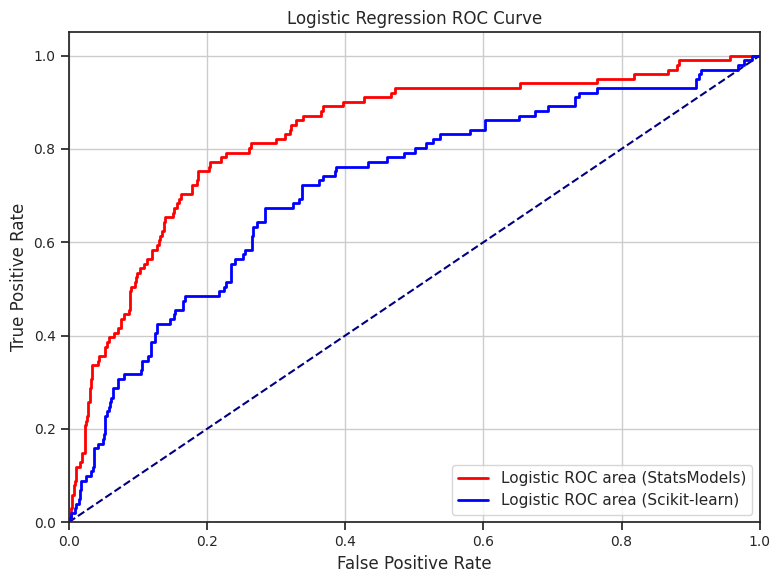

In [33]:
plt.figure(figsize=(8, 6))

plt.plot([0, 1], [0, 1], color='navy', linestyle='--')  # Diagonal reference line
plt.plot(fpr_sm, tpr_sm, color='red', lw=2, label='Logistic ROC area (StatsModels)')  # StatsModels ROC curve
plt.plot(fpr, tpr, color='blue', lw=2, label='Logistic ROC area (Scikit-learn)')  # Scikit-learn ROC curve

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.title('Logistic Regression ROC Curve')

plt.legend(loc='lower right')
plt.grid(True)  # Add grid lines
plt.tight_layout()  # Adjust spacing between plot elements

# Customize tick labels and font size
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.show()

In [34]:
# For comparision, we will build another model 

cols = ['Total day calls', 'Total eve minutes', 'Customer service calls', 'International plan', 'Number vmail messages']

X_tr = X_train[cols]
X_te = X_test[cols]

X_tr.columns


Index(['Total day calls', 'Total eve minutes', 'Customer service calls',
       'International plan', 'Number vmail messages'],
      dtype='object')

In [35]:
# Training the sk learn model on handpicked columns

logmodel = LogisticRegression() 
logmodel.fit(X_tr, y_train)

# We don't see the warning this time, shows multicollinearity has been taken care

logmodel.coef_

array([[ 7.28870461e-04,  5.12574817e-03,  4.56711407e-01,
         1.99913695e+00, -2.60506755e-02]])

In [36]:
coef = np.array(logmodel.coef_)
coef = coef.reshape([len(cols),])
var_coef = pd.DataFrame({'Vars': cols, 'coef': coef}) 
var_coef['odds_ratio'] = np.exp(var_coef['coef']) 
var_coef

,Vars,coef,odds_ratio
0,Total day calls,0.000729,1.000729
1,Total eve minutes,0.005126,1.005139
2,Customer service calls,0.456711,1.578873
3,International plan,1.999137,7.382682
4,Number vmail messages,-0.026051,0.974286


##**👉 Observation -**

* Odds ratio of "International Plan" is very high, suggesting that the impact of this variable is much more on the target variable compare to other variables.

* People having international plan are more likely to leave the service, hence our target group is a little isolated now.

* Customer service calls also has odds ratio more than 1, suggesting people are more like to leave if the number of calls to customer service is high.

In [37]:
#Effect of cutoff on model performance

pred = logmodel.predict(X_te) #Takes the default cutoff of 0.5 print("Confusion matrix: ")
print("Confusion matrix: ")
print(confusion_matrix(y_test, pred))
print("Precision: ", precision_score(y_test, pred)) 
print("Recall: ", recall_score(y_test, pred))


Confusion matrix: 
[[553  13]
 [ 89  12]]
Precision:  0.48
Recall:  0.1188118811881188


In [38]:
# Changing the cutoff to 0.3
prob = logmodel.predict_proba(X_te)

pred_new = np.where(prob[:,1] > 0.3, 1, 0) 
print("Confusion matrix: ") 
print(confusion_matrix(y_test, pred_new)) 
print("Precision: ", precision_score(y_test, pred_new)) 
print("Recall: ", recall_score(y_test, pred_new))

Confusion matrix: 
[[525  41]
 [ 71  30]]
Precision:  0.4225352112676056
Recall:  0.297029702970297


### 👉 Recall score has improved on changing the cut-off.

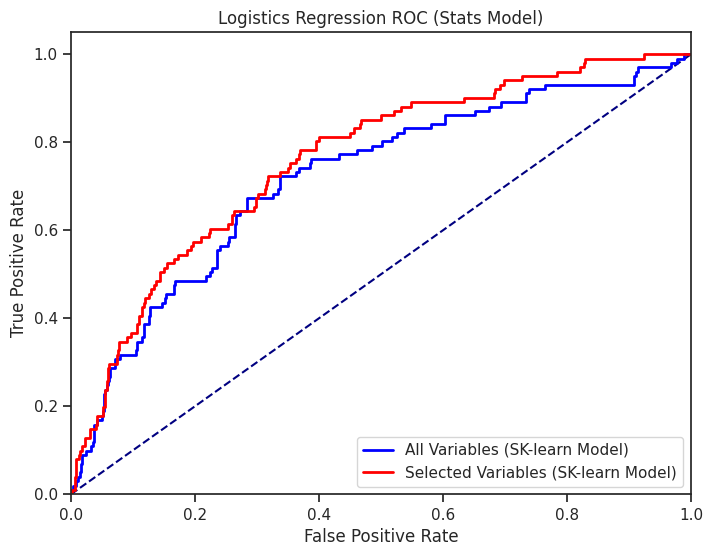

In [39]:
fpr_new, tpr_new, treshholds = roc_curve(y_test, prob[:,1], pos_label=1) 
roc_auc_new = auc(fpr_new,tpr_new)

plt.figure(figsize=(8, 6))
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.plot([0,1],[0,1], color = 'navy', linestyle = '--') 
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])

plt.title('Logistics Regression ROC (Stats Model)')
plt.plot(fpr,tpr,color = 'blue', lw = 2, label = 'All Variables (SK-learn Model)')
plt.plot(fpr_new,tpr_new,color = 'red', lw = 2, label = 'Selected Variables (SK-learn Model)')
plt.legend(loc = 'lower right')
plt.show()

👉  Dropping few columns has increased the model performance slightly suggesting that the multicollinearity was causing trouble

👉 What is the ideal cut-off?

 * This can be found from the recall-precision curv

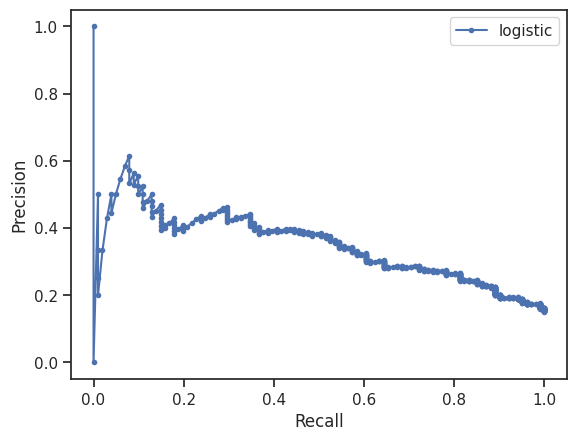

In [40]:
from sklearn.metrics import precision_recall_curve

precision, recall, thresholds = precision_recall_curve(y_test,prob[:,1]) 
plt.plot(recall, precision, marker = '.', label = 'logistic') 
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend() 
plt.show()

👉 According to our business demand, the trade-off between recall and precision can be made

For this model, the sweet spot is around 0.29 for Recall

# **Making business decisions**

* Isolating high risk customers

In [41]:
chart_data = X_test[cols]
chart_data["Probability"] = prob[:,1]
chart_data = chart_data.sort_values(by = "Probability", ascending= False) 
chart_data.head()

,Total day calls,Total eve minutes,Customer service calls,International plan,Number vmail messages,Probability
1610,73,293.9,4,1,0,0.817317
1192,98,251.8,4,1,0,0.785953
1253,97,211.7,4,1,0,0.749215
184,68,245.0,3,1,0,0.687245
279,135,219.1,3,1,0,0.668929


In [42]:
chart_data["decile"] = pd.qcut(chart_data["Probability"], 10) 
chart_data.head()

,Total day calls,Total eve minutes,Customer service calls,International plan,Number vmail messages,Probability,decile
1610,73,293.9,4,1,0,0.817317,"(0.311, 0.817]"
1192,98,251.8,4,1,0,0.785953,"(0.311, 0.817]"
1253,97,211.7,4,1,0,0.749215,"(0.311, 0.817]"
184,68,245.0,3,1,0,0.687245,"(0.311, 0.817]"
279,135,219.1,3,1,0,0.668929,"(0.311, 0.817]"


In [43]:
chart_data["row"] = np.arange(1, chart_data.shape[0]+1)
chart_data["decile1"] = np.ceil(chart_data["row"]/((chart_data.shape[0]+1)/10))
chart_data

,Total day calls,Total eve minutes,Customer service calls,International plan,Number vmail messages,Probability,decile,row,decile1
1610,73,293.9,4,1,0,0.817317,"(0.311, 0.817]",1,1.0
1192,98,251.8,4,1,0,0.785953,"(0.311, 0.817]",2,1.0
1253,97,211.7,4,1,0,0.749215,"(0.311, 0.817]",3,1.0
184,68,245.0,3,1,0,0.687245,"(0.311, 0.817]",4,1.0
279,135,219.1,3,1,0,0.668929,"(0.311, 0.817]",5,1.0
...,...,...,...,...,...,...,...,...,...
26,115,191.1,0,0,39,0.021041,"(0.013000000000000001, 0.0388]",663,10.0
1377,134,71.0,1,0,34,0.020739,"(0.013000000000000001, 0.0388]",664,10.0
599,62,200.9,0,0,46,0.017797,"(0.013000000000000001, 0.0388]",665,10.0
1815,82,159.7,0,0,42,0.016252,"(0.013000000000000001, 0.0388]",666,10.0


In [44]:
chart_data["target"] = y_test
lift = chart_data.groupby('decile1').agg({
    'target': ['count', 'sum']
})['target'].sort_index(ascending=True)
lift.columns = ["Number of customers", 'Number of left']
lift['Cummulative left'] = lift['Number of left'].cumsum()
lift['Percent of Events'] = lift['Number of left'] / lift['Number of left'].sum() * 100
lift['Gain'] = lift['Percent of Events'].cumsum()
lift['Lift'] = lift['Gain'] / np.array(range(10, 100 + 10, 10))
lift


,Number of customers,Number of left,Cummulative left,Percent of Events,Gain,Lift
decile1,,,,,,
1.0,66,30,30,29.702970,29.702970,2.970297
2.0,67,21,51,20.792079,50.495050,2.524752
3.0,67,10,61,9.900990,60.396040,2.013201
4.0,67,13,74,12.871287,73.267327,1.831683
5.0,67,8,82,7.920792,81.188119,1.623762
6.0,66,8,90,7.920792,89.108911,1.485149
7.0,67,1,91,0.990099,90.099010,1.287129
8.0,67,5,96,4.950495,95.049505,1.188119
9.0,67,4,100,3.960396,99.009901,1.100110


## 👉 **Observation -**

1. We sort the data points in decreasing order of their associated probabilities of being at risk (=1)

2. Cutinng the test data in deciles would help us in isolating the high risk customers so targetting them becomes easy.

3. On avaerage there were around 14% customers that churned. But here in the top decile we have 2.97 times more indicate by lift.

Lift = target response(Benchmark)/average responce

In the top 4 deciles, we cover 72.26% percent of high risk customers from our test data.


# 👉 **Result -**

* We can see in the plot how we have isolated the high risk customers in the top deciles.(Indicated by Orange Bar)


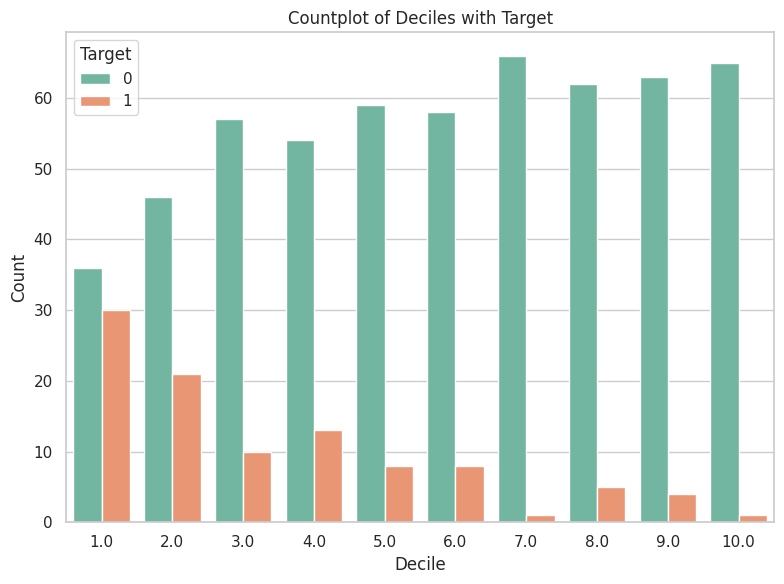

In [45]:
sns.set_style("whitegrid")  # Set the style of the plot
sns.set_palette("Set2")  # Set the color palette

plt.figure(figsize=(8, 6))  # Set the figure size

sns.countplot(x='decile1', hue='target', data=chart_data)

plt.xlabel("Decile")  # Set the x-axis label
plt.ylabel("Count")  # Set the y-axis label
plt.title("Countplot of Deciles with Target")  # Set the title of the plot

plt.legend(title="Target", loc="upper left")  # Add a legend

plt.tight_layout()  # Adjust the spacing between subplots and labels

plt.show()  # Display the plot
